In [12]:

import numpy as np
import cv2
import time
import matplotlib.pyplot as plt
from optical_flow import *

## Utility functions for loading images and plotting

In [13]:
def load_folder_images(folder_path):
    images = []
    image_names = sorted(os.listdir(folder_path))
    for image_name in image_names:
        image_path = os.path.join(folder_path, image_name)
        im = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        im = im.astype(np.float32)
        images.append(im)
    return images

def show_flow_on_image(image, u, v, figsize=(10, 10)):
    _, ax = plt.subplots(1, 1, figsize=figsize)
    show_flow(u, v, ax, set_aspect=True)
    plt.imshow(image, cmap='gray', extent=[0, image.shape[1], -image.shape[0], 0])
    plt.axis('off')

In [14]:
im1 = np.random.rand(200, 200).astype(np.float32)
im2 = im1.copy()
im2 = rotate_image(im2, -1)
U_lk , V_lk = lucas_kanade(im1, im2, 3, sigma=1, epsilon=1e-8)
U_hs , V_hs = horns_chunck(im1, im2, 1000, 0.5)

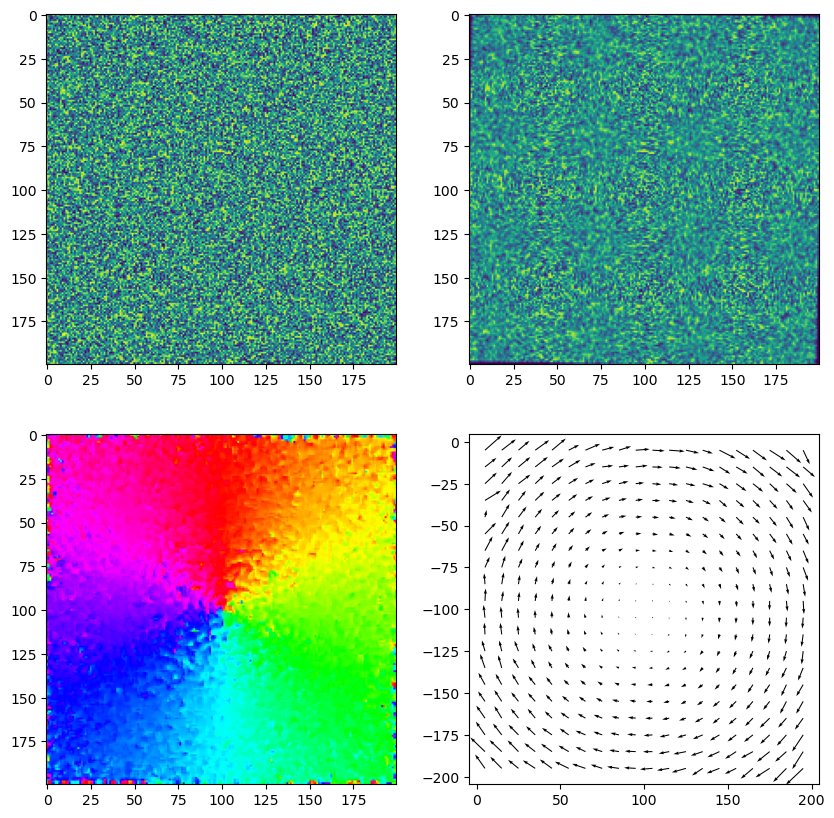

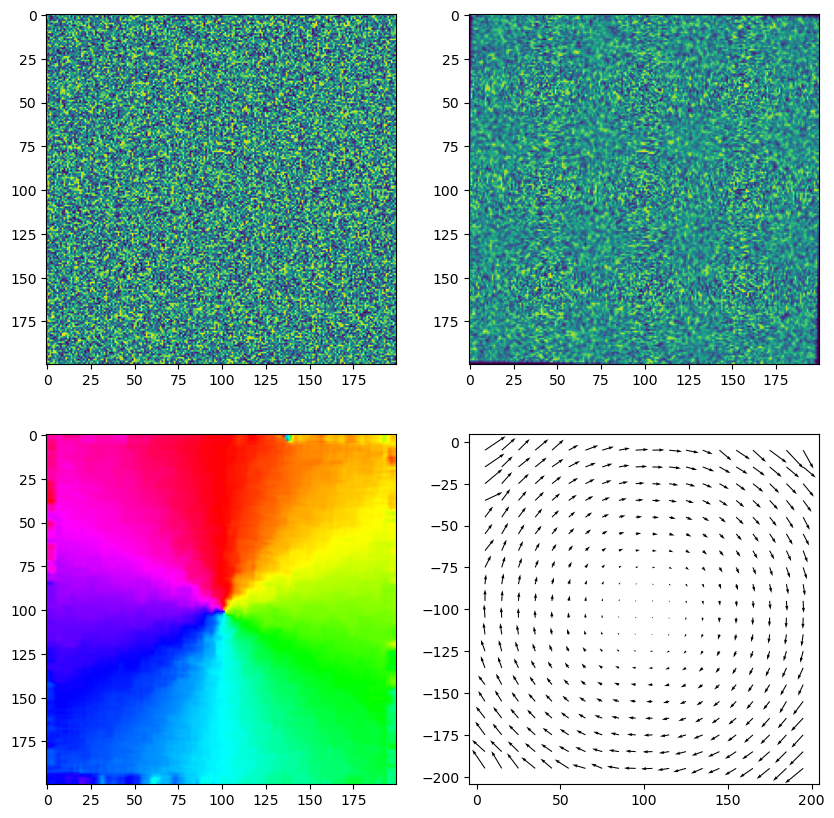

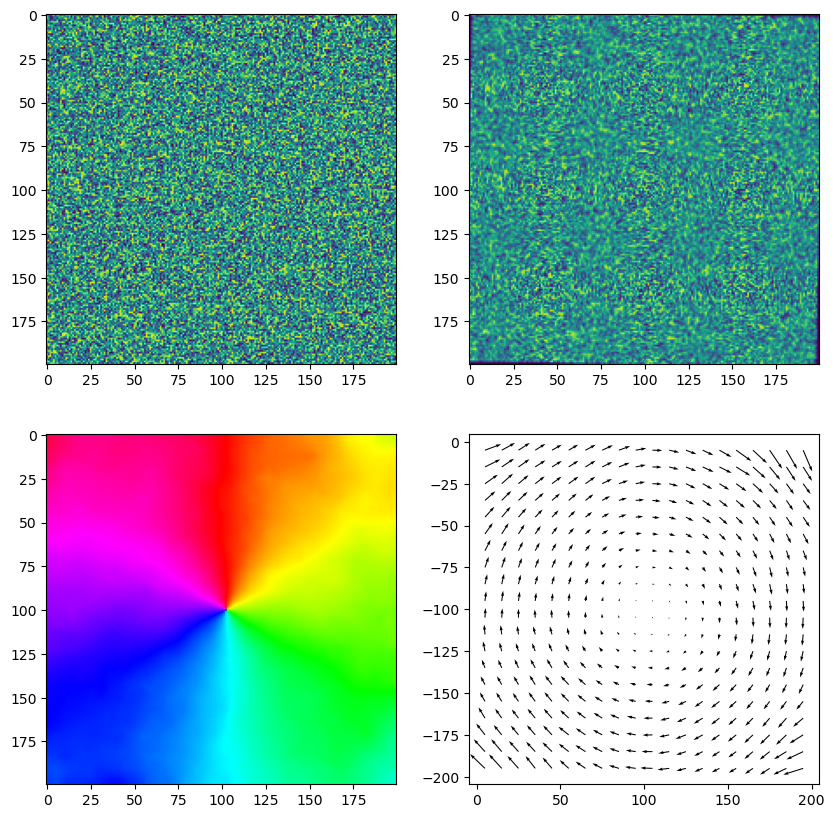

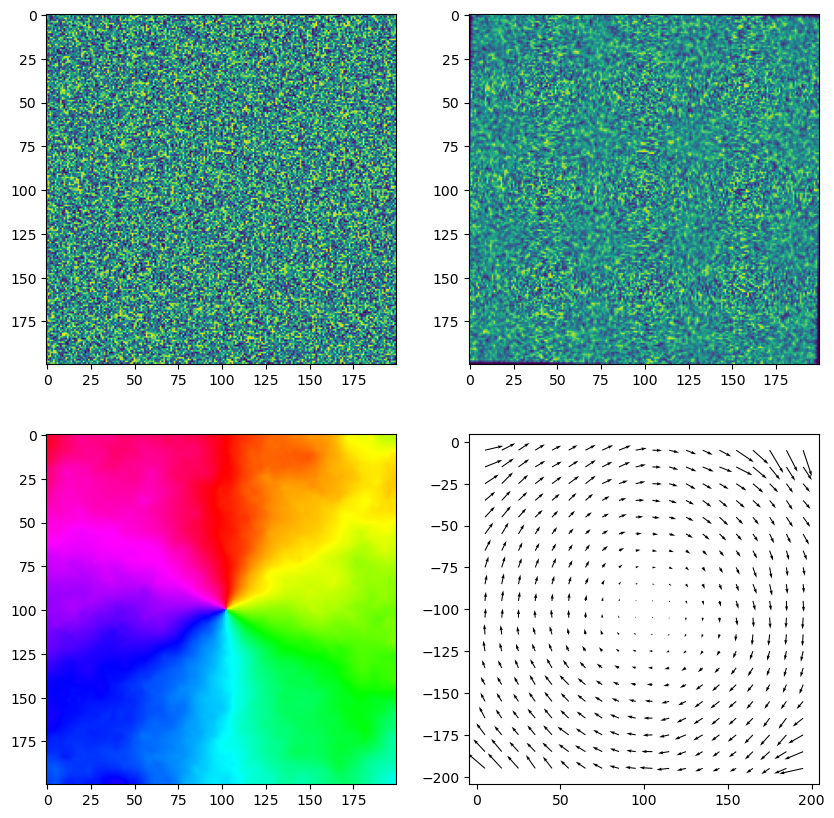

In [15]:
fig1, (( ax1_11 , ax1_12 ) , (ax1_21 , ax1_22)) = plt.subplots(2, 2, figsize=(10, 10))
ax1_11.imshow(im1)
ax1_12.imshow(im2)
show_flow(U_lk, V_lk , ax1_21 , type='angle')
show_flow( U_lk , V_lk , ax1_22 , type='field' , set_aspect=True)
# fig1.suptitle( 'Lucas-Kanade Optical Flow')
fig1.savefig('./results/random_noise/lk.pdf')

U_lk , V_lk = lucas_kanade(im1, im2, 9, sigma=1, epsilon=1e-8)
U_hs , V_hs = horns_chunck(im1, im2, 1000, 0.5)
fig1, (( ax1_11 , ax1_12 ) , (ax1_21 , ax1_22)) = plt.subplots(2, 2, figsize=(10, 10))
ax1_11.imshow(im1)
ax1_12.imshow(im2)
show_flow(U_lk, V_lk , ax1_21 , type='angle')
show_flow( U_lk , V_lk , ax1_22 , type='field' , set_aspect=True)
# fig1.suptitle( 'Lucas-Kanade Optical Flow')
fig1.savefig('./results/random_noise/lk_9x9.pdf')

fig1, (( ax1_11 , ax1_12 ) , (ax1_21 , ax1_22)) = plt.subplots(2, 2, figsize=(10, 10))
ax1_11.imshow(im1)
ax1_12.imshow(im2)
show_flow(U_hs, V_hs , ax1_21 , type='angle')
show_flow( U_hs , V_hs , ax1_22 , type='field' , set_aspect=True)
# fig1.suptitle( 'Horn-Schunck Optical Flow')
fig1.savefig('./results/random_noise/hs.pdf')


U_hs , V_hs = horns_chunck(im1, im2, 500, 0.5)
fig1, (( ax1_11 , ax1_12 ) , (ax1_21 , ax1_22)) = plt.subplots(2, 2, figsize=(10, 10))
ax1_11.imshow(im1)
ax1_12.imshow(im2)
show_flow(U_hs, V_hs , ax1_21 , type='angle')
show_flow( U_hs , V_hs , ax1_22 , type='field' , set_aspect=True)
# fig1.suptitle( 'Horn-Schunck Optical Flow')
fig1.savefig('./results/random_noise/hs_500.pdf')


In [16]:
truck_images = load_folder_images('./collision')
lab_images = load_folder_images('./lab2')

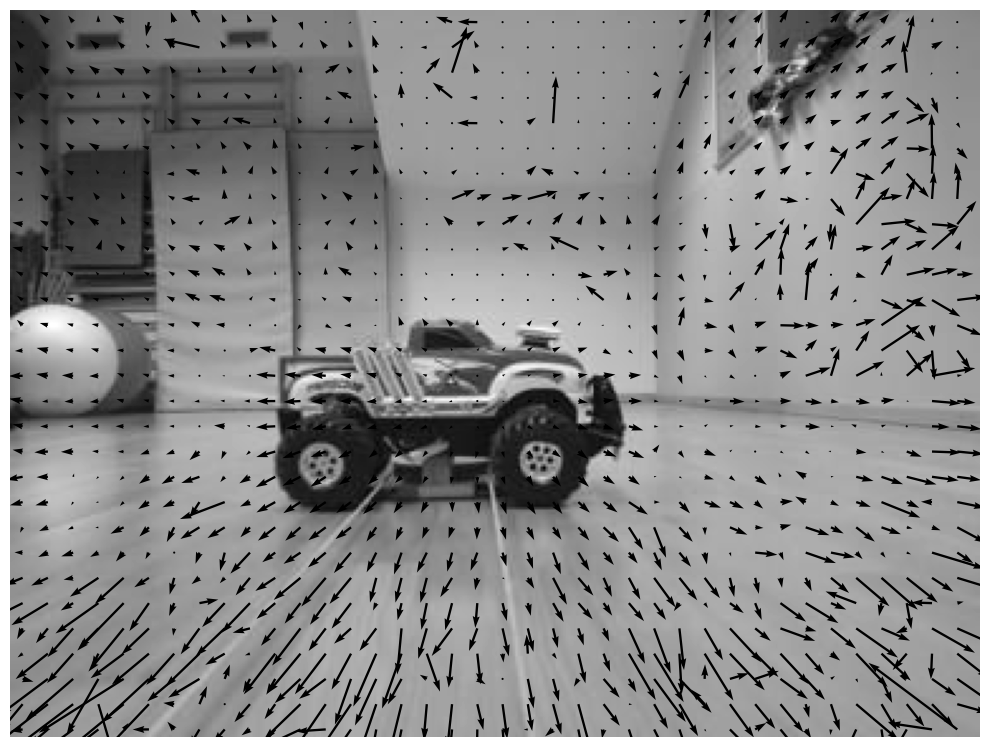

In [17]:
# lab_image1, lab_image2 = lab_images[0], lab_images[1]

u_lk, v_lk = lucas_kanade(truck_images[140], truck_images[141], 11, sigma=1, epsilon=1e-8, 
                          harris=False,
                          harris_alpha=0.1,
                          harris_threshold=0.1)

u_hs, v_hs = horns_chunck(truck_images[140], truck_images[141], 1000, 0.5)

show_flow(U_lk, V_lk , ax1_21 , type='angle')
fig1.savefig('./results/random_noise/lk.pdf')


show_flow_on_image(truck_images[140], u_lk, v_lk)
plt.tight_layout()
plt.savefig('./results/collision/lk_haris.pdf')

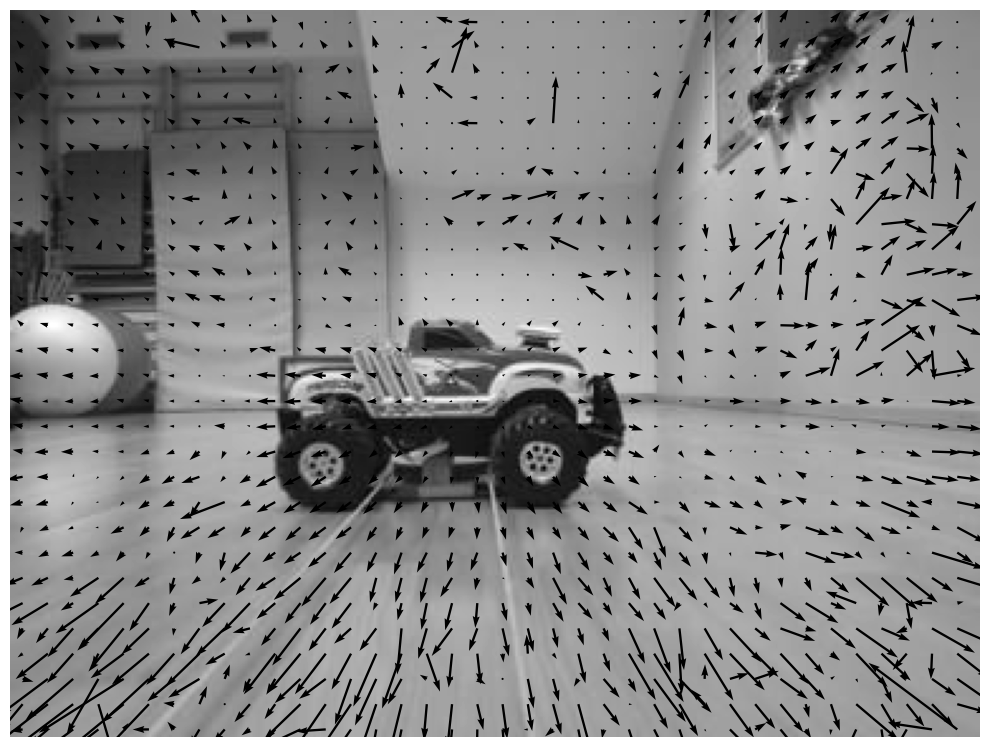

In [18]:

u_lk, v_lk = lucas_kanade(truck_images[140], truck_images[141], 11, sigma=1, epsilon=1e-8, 
                          harris=False,
                          harris_alpha=0,
                          harris_threshold=0)

show_flow_on_image(truck_images[140], u_lk, v_lk)
plt.tight_layout()
plt.savefig('./results/collision/lk_no_haris.pdf')

(480, 854)


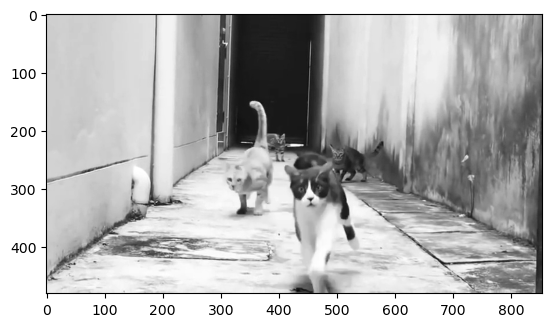

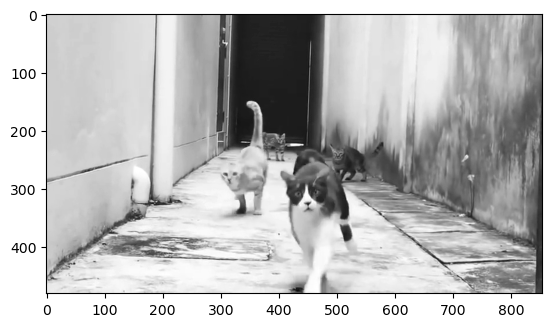

In [19]:
img_dog1 = cv2.imread('./macki/frame_831.jpg', cv2.IMREAD_GRAYSCALE)
img_dog2 = cv2.imread('./macki/frame_832.jpg', cv2.IMREAD_GRAYSCALE)
print(img_dog1.shape)
# img_dog1 = cv2.resize(img_dog1, (640 // 2, 360 // 2))
# img_dog2 = cv2.resize(img_dog2, (640 // 2, 360 // 2))

plt.imshow(img_dog1, cmap='gray')
plt.show()
plt.imshow(img_dog2, cmap='gray')

(30, 54) (30, 54)


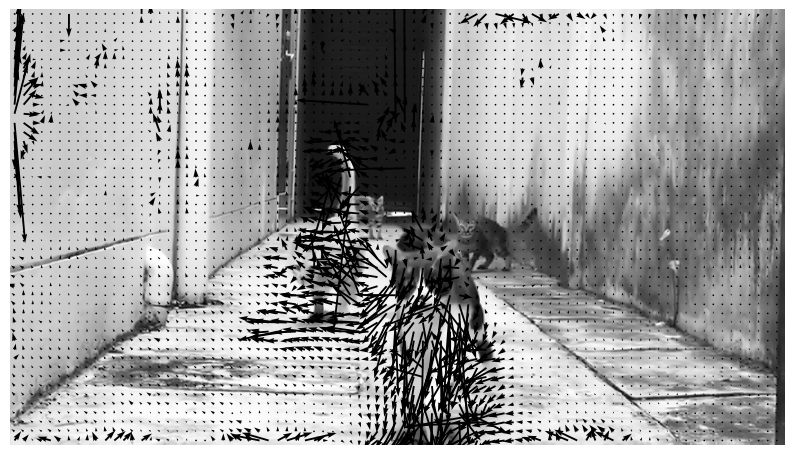

In [20]:
u_p, v_p = lucas_kanade_pyramidal(img_dog1, 
                                  img_dog2, 
                                  N=11, 
                                  levels=4, 
                                  sigma=1, 
                                  harris=False, 
                                  harris_alpha=0.1, 
                                  harris_threshold=0.04)

show_flow_on_image(img_dog1, u_p, v_p)
plt.savefig('./results/lk_pyramidal.pdf', bbox_inches='tight')

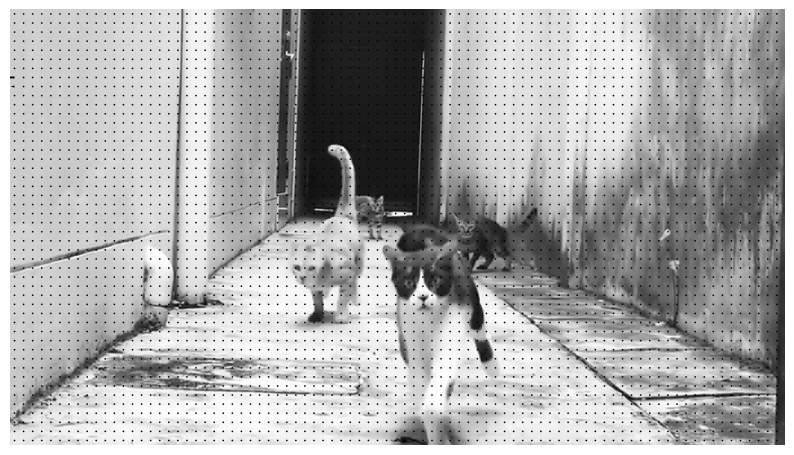

In [21]:
u_p, v_p = lucas_kanade(img_dog1, 
                        img_dog2, 
                        N=11, 
                        sigma=1, 
                        harris=False, 
                        harris_alpha=0.1, 
                        harris_threshold=0.04)

show_flow_on_image(img_dog1, u_p, v_p)
plt.savefig('./results/lk_no_pyramidal.pdf', bbox_inches='tight')

## Algorithm comparison

In [22]:

plt.savefig('./results/collision/lk_truck_150.pdf', bbox_inches='tight')


plt.savefig('./results/collision/hs_truck_150.pdf', bbox_inches='tight')

<Figure size 640x480 with 0 Axes>

In [23]:
img_cporta1 = cv2.imread('./disparity/cporta_left.png', cv2.IMREAD_GRAYSCALE)
img_cporta2 = cv2.imread('./disparity/cporta_right.png', cv2.IMREAD_GRAYSCALE)


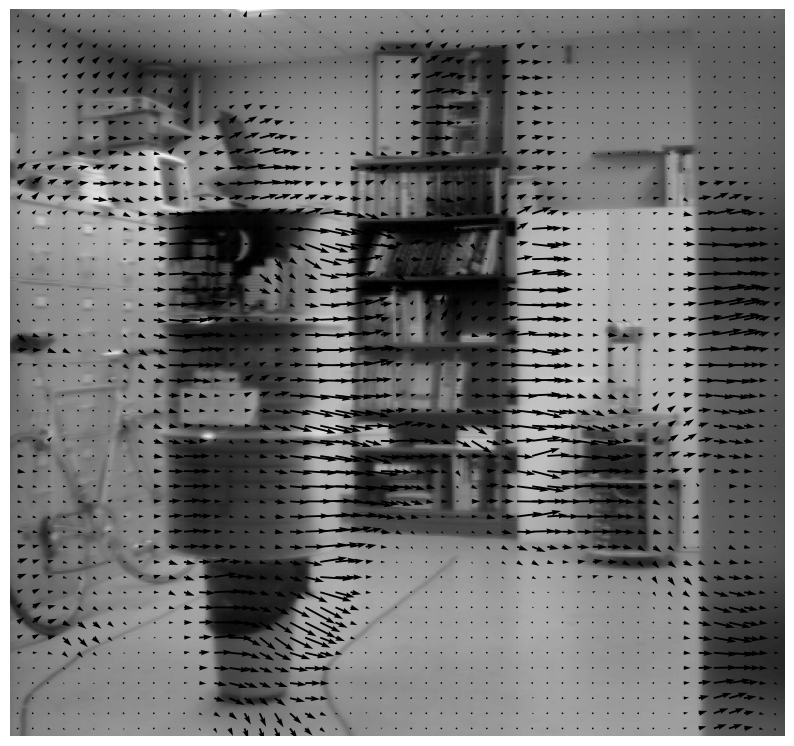

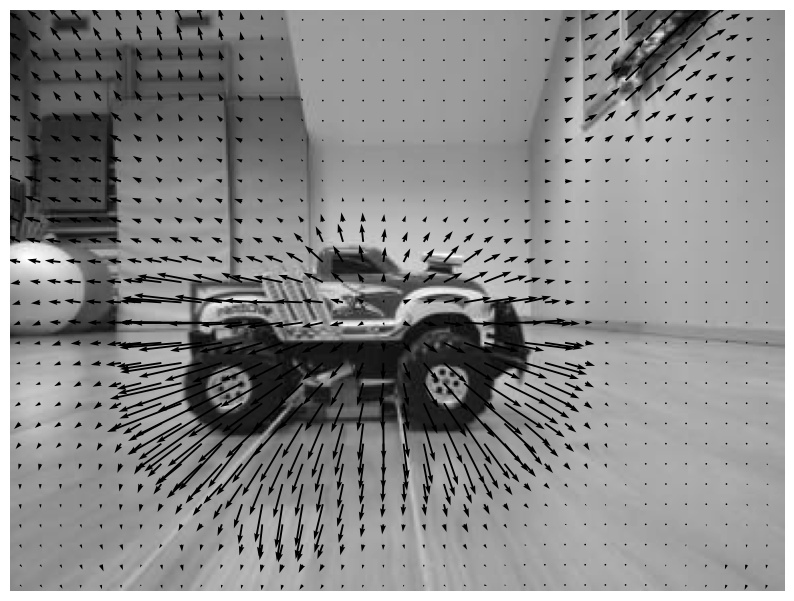

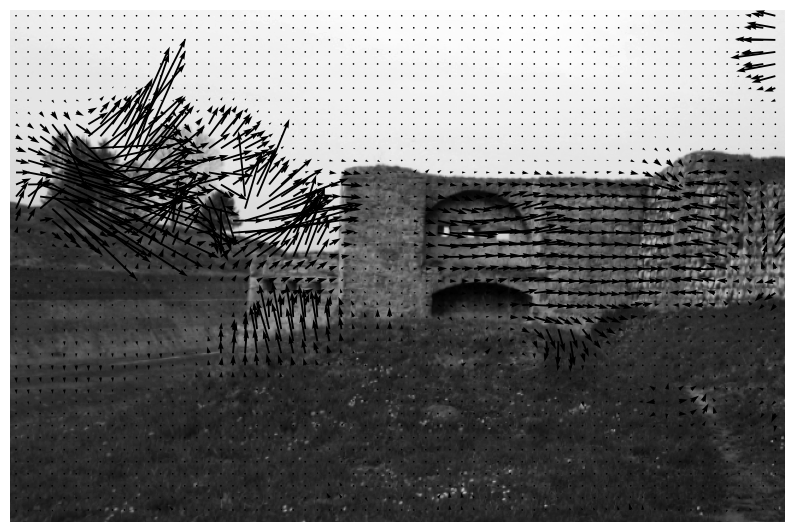

In [24]:




u_p, v_p = horns_chunck(lab_images[23],
                        lab_images[24],
                        1000,
                        0.5)

show_flow_on_image(lab_images[23], u_p, v_p)
plt.savefig('./results/lab_hc.pdf', bbox_inches='tight')

u_p, v_p = horns_chunck(truck_images[150],
                        truck_images[151],
                        1000,
                        0.5)

show_flow_on_image(truck_images[150], u_p, v_p)
plt.savefig('./results/collision/hs_truck_150.pdf', bbox_inches='tight')

u_p, v_p = horns_chunck(img_cporta1,
                        img_cporta2,
                        1000,
                        1)

show_flow_on_image(img_cporta1, u_p, v_p)
plt.savefig('./results/hs_porta.pdf', bbox_inches='tight')
# show_flow_on_image(lab_images[23], u_p, v_p)
# plt.savefig('./results/lab_hs.pdf', bbox_inches='tight')

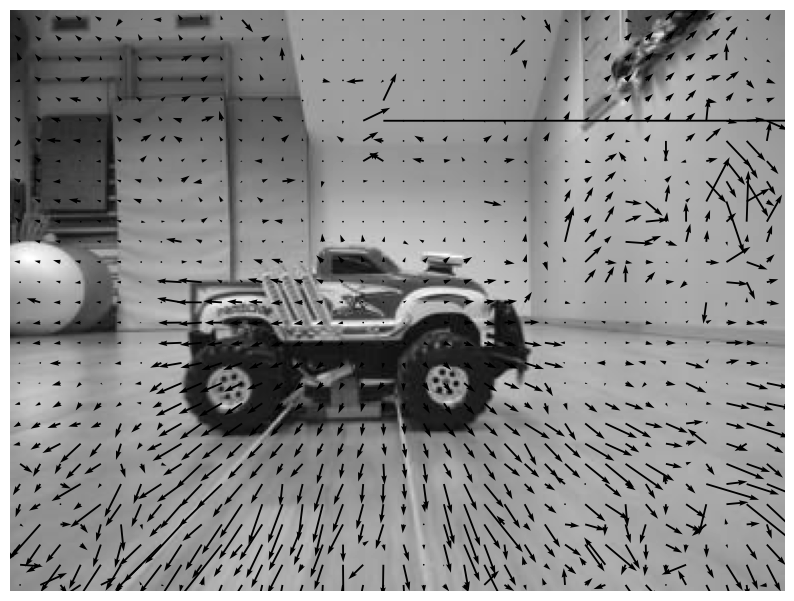

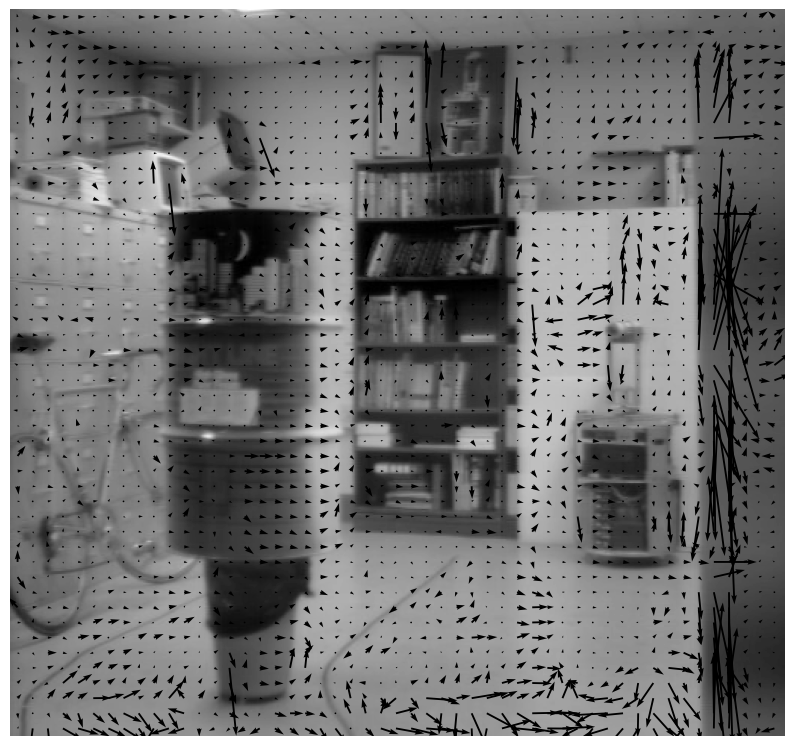

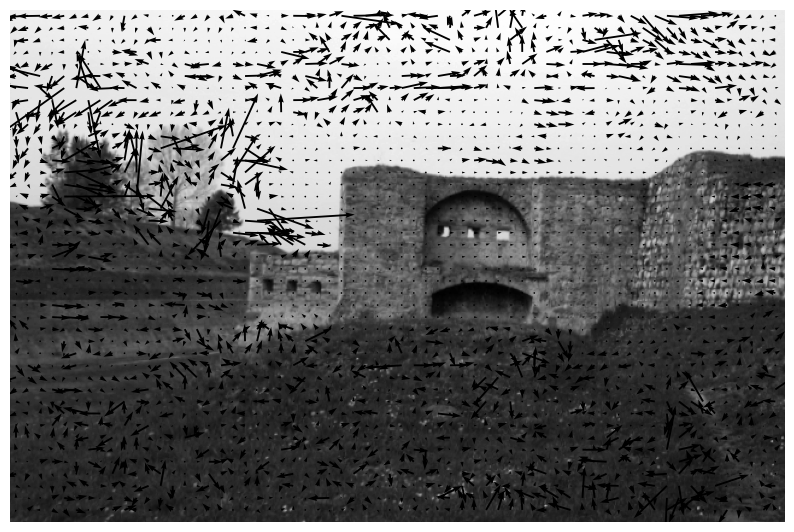

In [25]:

# fig , ax = plt.subplots(3, 1, figsize=(10, 10))

u_p, v_p = lucas_kanade(truck_images[150],
                        truck_images[151],
                        N=11,
                        sigma=1,
                        harris=False)


show_flow_on_image(truck_images[150], u_p, v_p)
plt.savefig('./results/lk_truck_150.pdf', bbox_inches='tight')

u_p, v_p = lucas_kanade(lab_images[23],
                        lab_images[24],
                        N=11,
                        sigma=1,
                        harris=False)

# plt.subplot(312)
show_flow_on_image(lab_images[23], u_p, v_p)
plt.savefig('./results/lab_lk.pdf', bbox_inches='tight')

u_p, v_p = lucas_kanade(img_cporta1,
                        img_cporta2,
                        N=11,
                        sigma=2,
                        harris=False)


# plt.subplot(313)
show_flow_on_image(img_cporta1, u_p, v_p)
plt.savefig('./results/cporta_lk.pdf', bbox_inches='tight')
# plt.savefig('./results/cporta_lk.pdf', bbox_inches='tight')


# plt.savefig('./results/cporta_hs.pdf', bbox_inches='tight')

In [26]:
img_cporta1.shape

(425, 643)

In [27]:
import time

In [28]:
start = time.time()
horns_chunck(truck_images[130], truck_images[131], 1000, 1)
end = time.time()
print(end - start)

1.6370480060577393


In [29]:
start = time.time()
horns_chunck(truck_images[130], truck_images[131], 1000, 1, init_lucas_kanade=True)
end = time.time()
print(end - start)

2.02862548828125


In [30]:
start = time.time()
horns_chunck(truck_images[130], truck_images[131], 1000, 1)
end = time.time()
print(end - start)

1.7144863605499268


In [31]:
start = time.time()
horns_chunck(truck_images[130], truck_images[131], 500, 1)
end = time.time()
print(end - start)

0.8021442890167236


In [32]:
start = time.time()
lucas_kanade(truck_images[130], truck_images[131], 9, sigma=1)
end = time.time()
print(end - start)

0.016839981079101562


In [33]:
start = time.time()
lucas_kanade(truck_images[130], truck_images[131], 3, sigma=1)
end = time.time()
print(end - start)

0.007165670394897461


In [34]:
start = time.time()
lucas_kanade_pyramidal(truck_images[130], truck_images[131], 9, levels=4)
end = time.time()
print(end - start)

(18, 24) (18, 24)
0.03320956230163574


In [35]:
truck_images[130].shape

(288, 384)

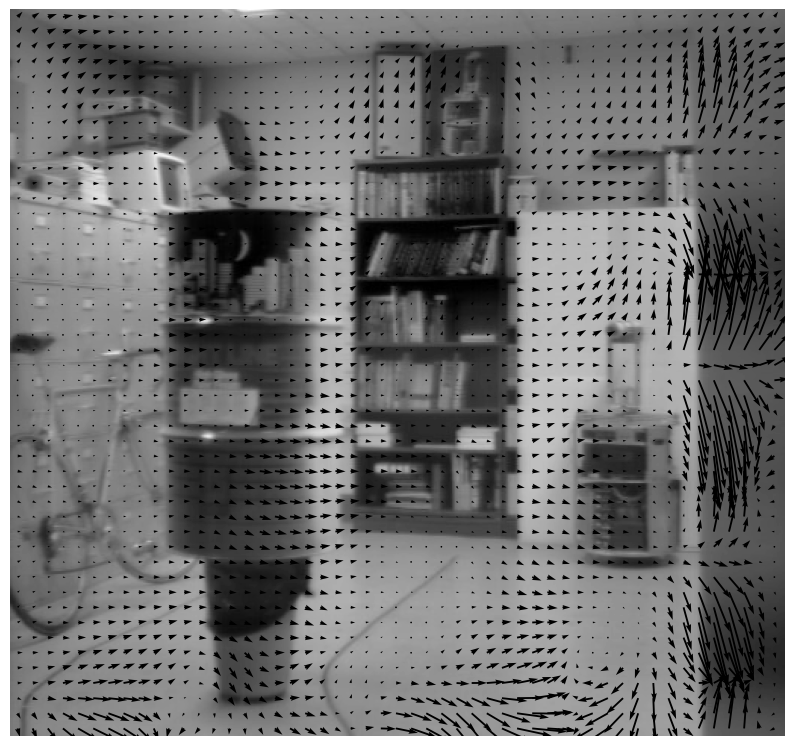

In [36]:
u_hs, v_hs = horns_chunck(lab_images[23], lab_images[24], 500, 1.5, init_lucas_kanade=True)
show_flow_on_image(lab_images[23], u_hs, v_hs)
plt.savefig('./results/lab_hs_LK.pdf', bbox_inches='tight')


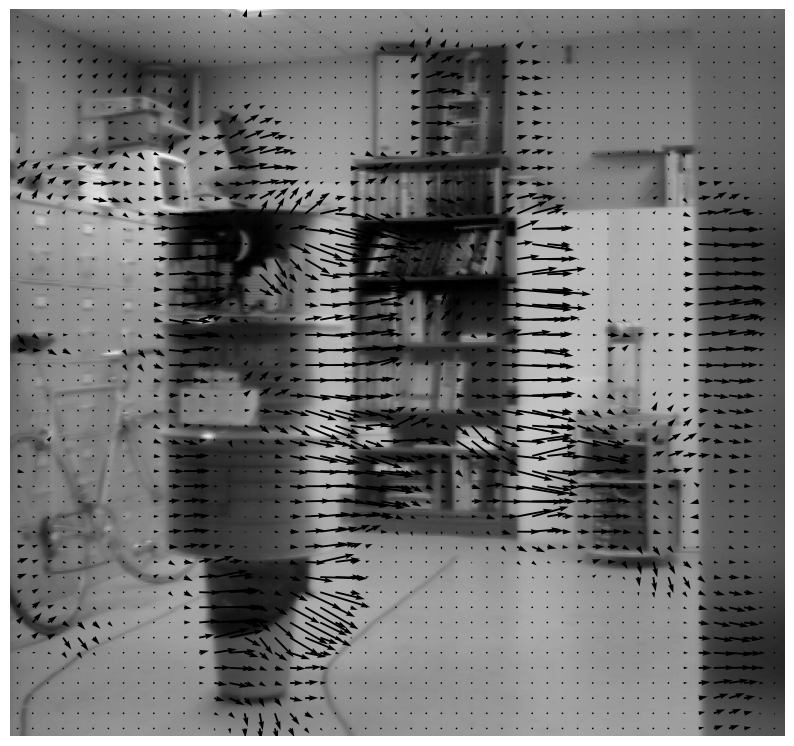

In [37]:
u_hs, v_hs = horns_chunck(lab_images[23], lab_images[24], 500, 1.5, init_lucas_kanade=False)
show_flow_on_image(lab_images[23], u_hs, v_hs)
plt.savefig('./results/lab_hs_NO_LK.pdf', bbox_inches='tight')